## Imports

In [1]:
import os
current_file_dir = os.getcwd()
os.chdir("../../codes/")

from src.load_explanations import load_explanations_of_many_models, _unify_lenths, _trim_image_path
from src import strings_to_classes_mappings

from src.compare_explanations import compare_explanations, cosine_similarity_distance_with_stdev_and_mean, radial_basis_function_distance_with_stdev_and_mean
from src.load_explanations import load_explanations_of_many_models

os.chdir(current_file_dir)

# Usage example

Get possible models etc.

In [2]:
print("Possible datasets:", list(strings_to_classes_mappings.datasets_mapping.keys()))
print("Possible models:", list(strings_to_classes_mappings.models_mapping.keys()))
print("Possible explanations:", list(strings_to_classes_mappings.explanations_mapping.keys()))
models_list = list(strings_to_classes_mappings.models_mapping.keys())

Possible datasets: ['imagenette2']
Possible models: ['ConvNeXtV2_Nano', 'DeiT_S', 'DeiT_T', 'DenseNet121', 'EfficientNet_B3', 'EfficientNet_B4', 'MobileNetV3', 'PyramidViT_V2_B2', 'Res2Net50', 'ResNet18', 'ResNet50', 'ResNeXt50', 'Swin_T', 'ViT_B_32']
Possible explanations: ['GradCAM', 'IntegratedGradients', 'KernelSHAP']


# Loading data

In [3]:
import os
current_file_dir = os.getcwd()
os.chdir("../../codes/")
from src.utils import models_to_architecture_mapping
os.chdir(current_file_dir)

In [4]:
similarity_matriced_csvs = [f for f in os.listdir('.') if f.endswith('.csv') and f.startswith('dissimilarity_matrix')]
similarity_matriced_csvs

['dissimilarity_matrix_gradcam_cosine.csv',
 'dissimilarity_matrix_gradcam_rbf.csv',
 'dissimilarity_matrix_integratedgradients_cosine.csv',
 'dissimilarity_matrix_integratedgradients_rbf.csv',
 'dissimilarity_matrix_kernelshap_cosine.csv',
 'dissimilarity_matrix_kernelshap_rbf.csv']

## Heatmaps of dissimilarities

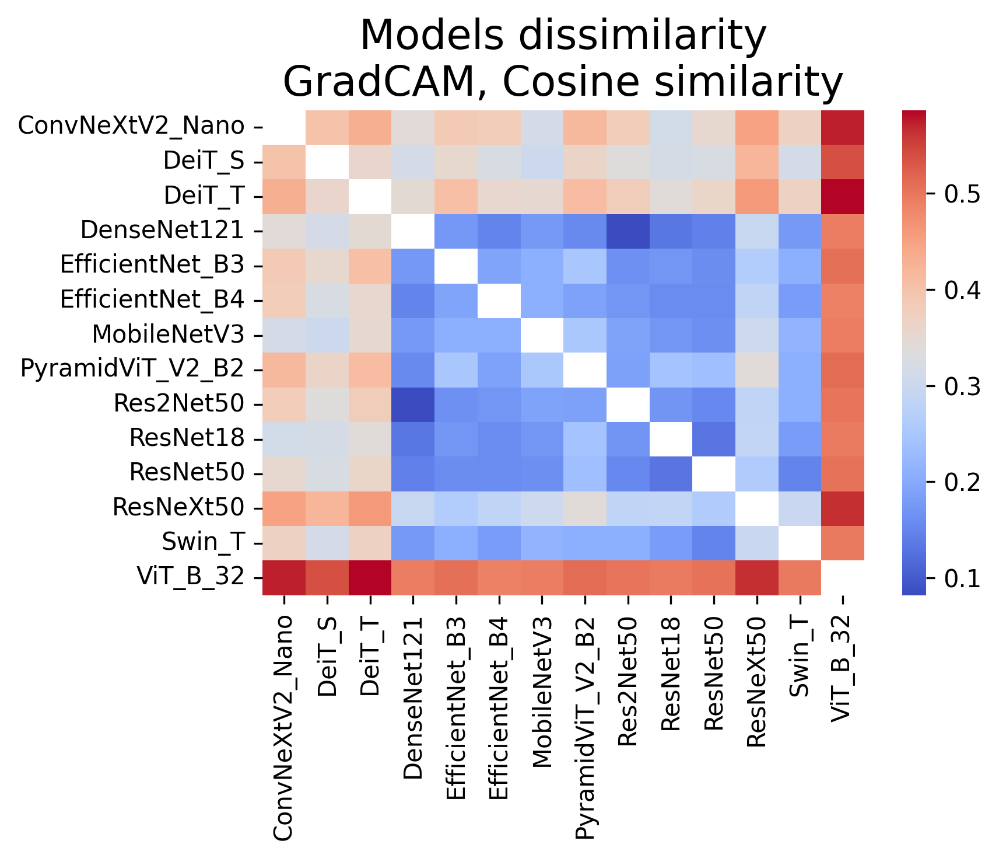

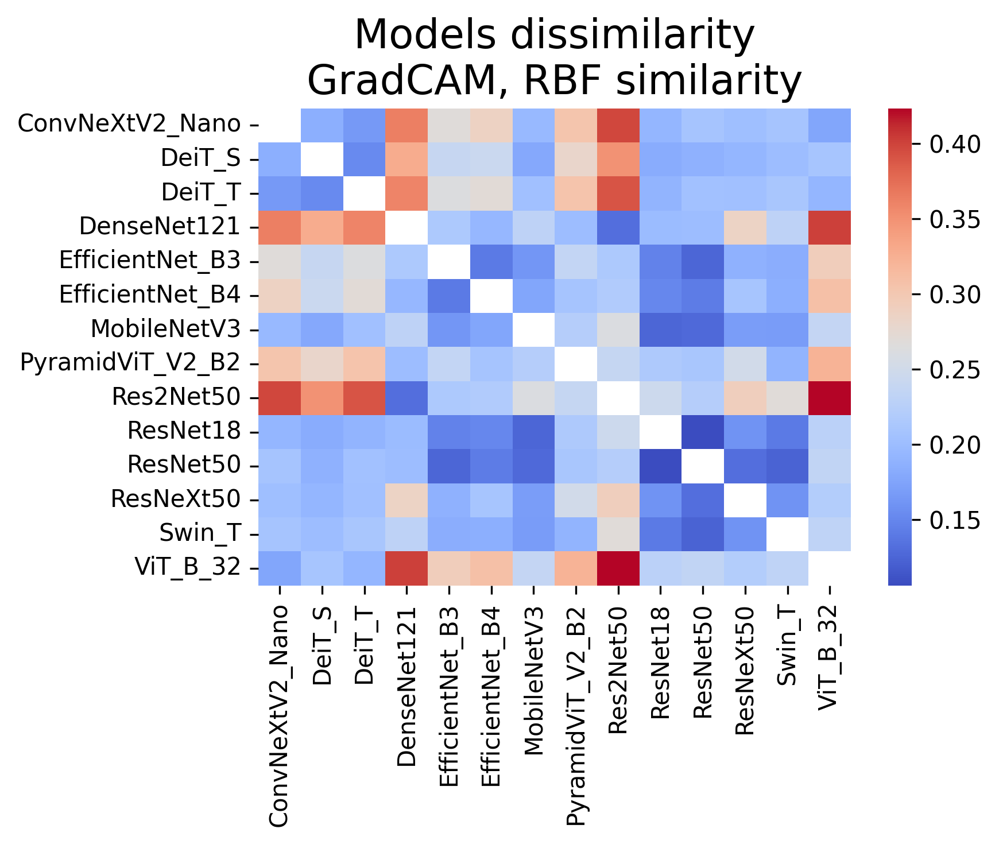

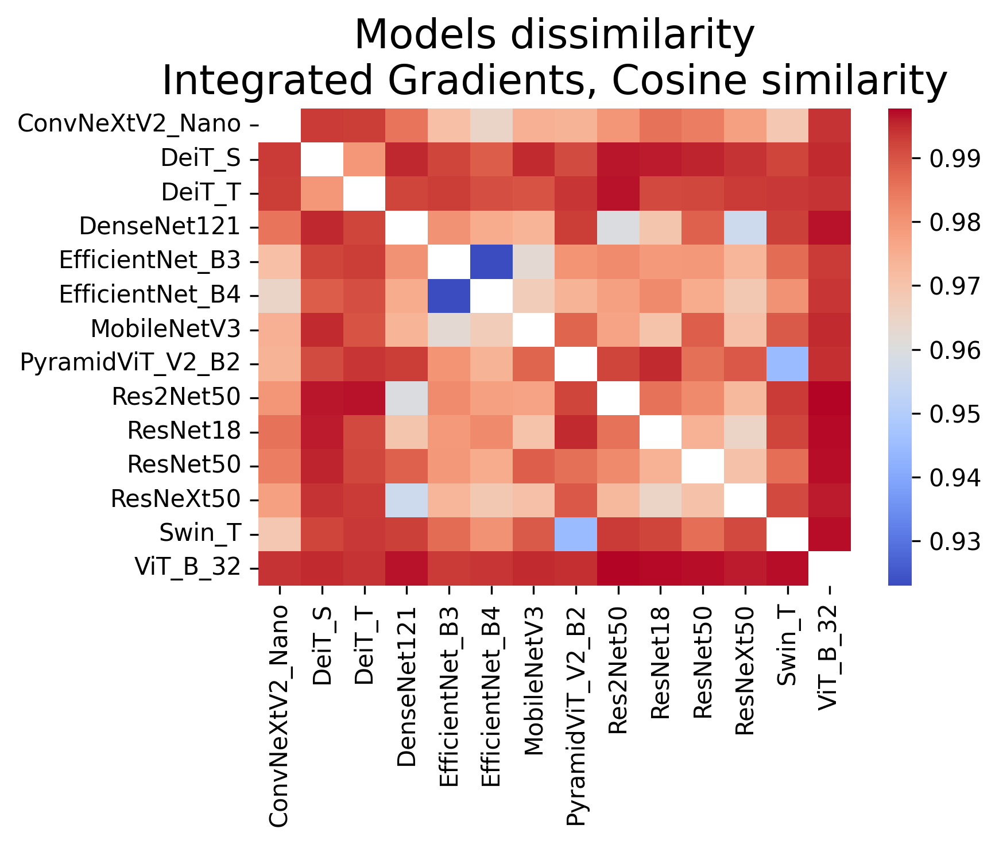

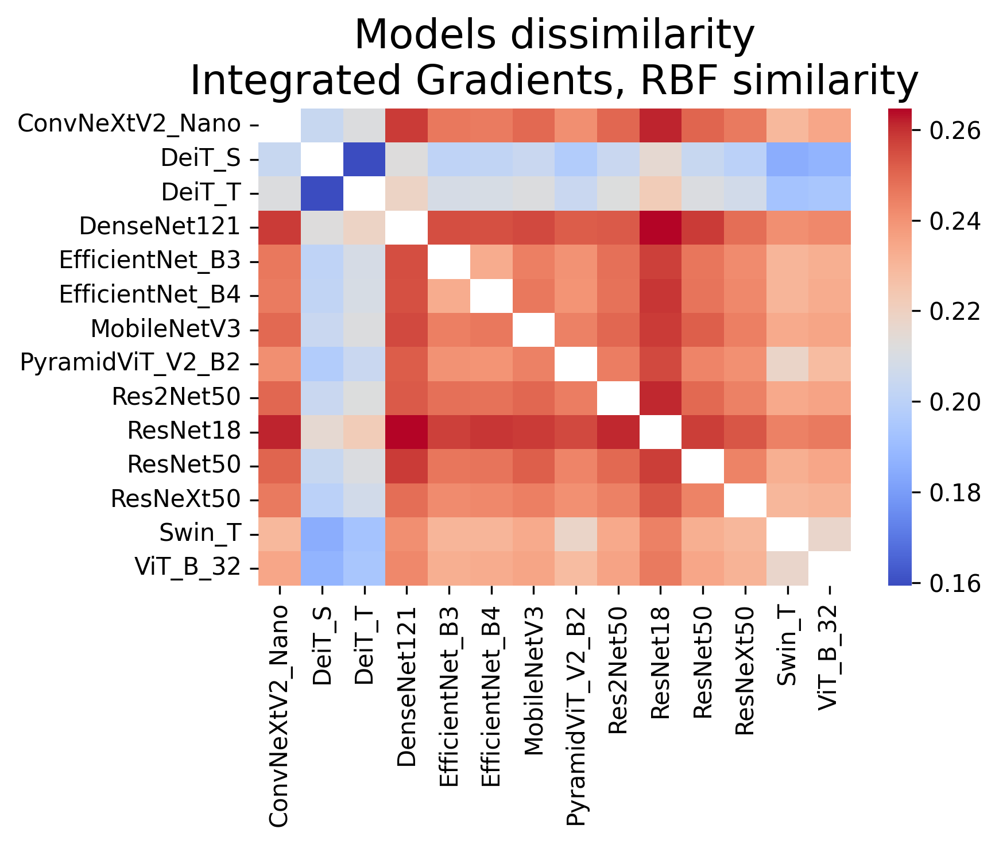

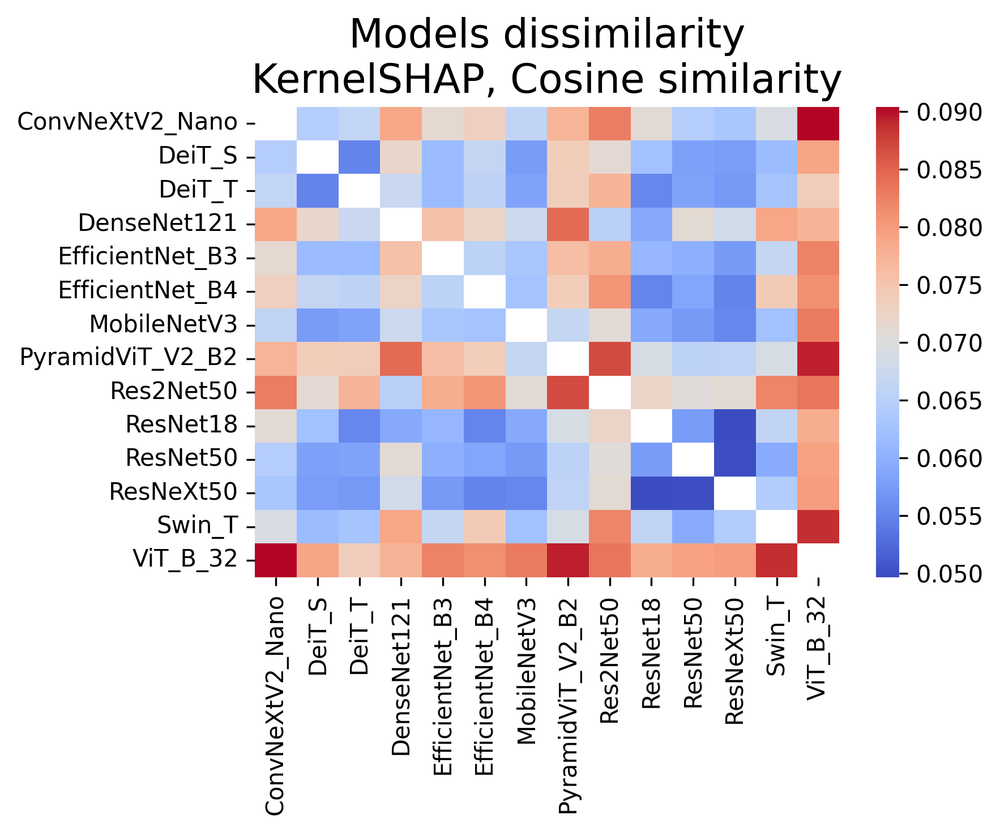

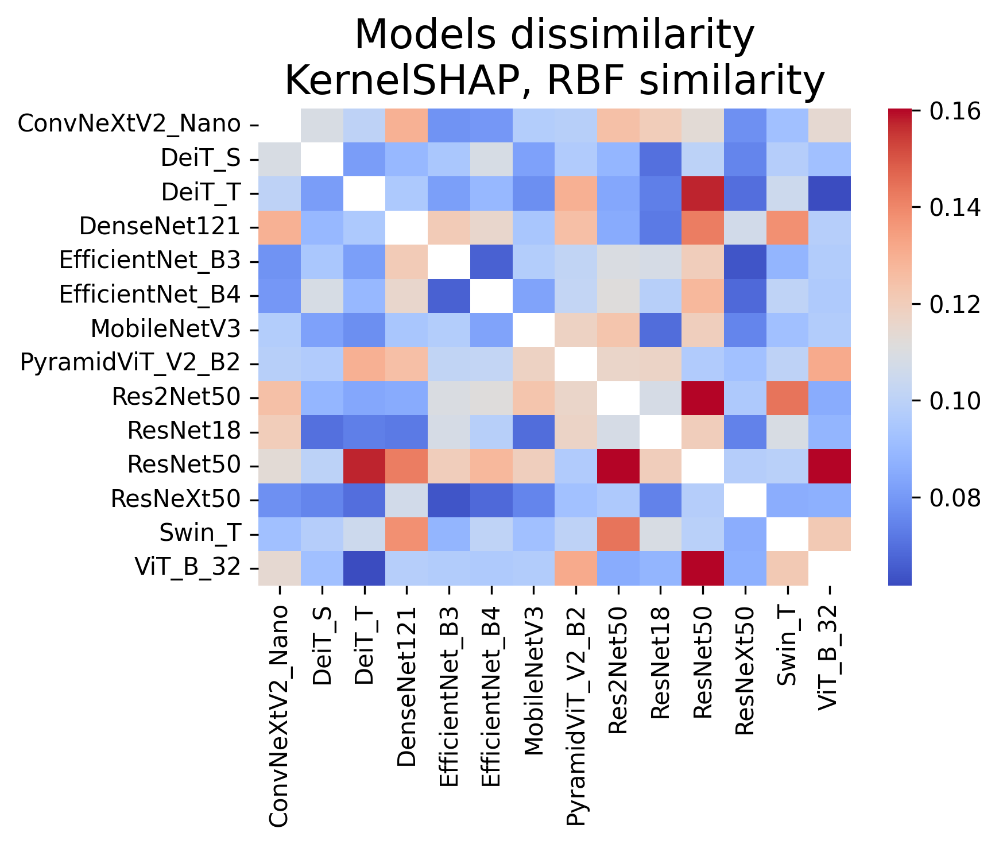

In [5]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# plot heatmap
def plot_heatmap(df, title, output_filename):
    mask = np.eye(df.shape[0], dtype=bool)
    fig, ax = plt.subplots(figsize=(6, 5), dpi=300)
    sns.heatmap(df, mask=mask, cmap='coolwarm', ax=ax)
    plt.title(title, fontsize=17)
    plt.tight_layout()
    plt.savefig(output_filename)
    plt.show()

explanation_name_mapping = {
    'integratedgradients': 'Integrated Gradients',
    'gradcam': 'GradCAM',
    'kernelshap': 'KernelSHAP',
}
dissimilarity_name_mapping = {
    'cosine': 'Cosine similarity',
    'rbf': 'RBF similarity',
}

# for csv_name in similarity_matriced_csvs:
#     splitted = csv_name.split('_')
#     explanation_method, similarity_metric = splitted[2], splitted[3].split('.')[0]
#     title = f"Graph community detection - Louvain\n{explanation_name_mapping[explanation_method]}, {similarity_name_mapping[similarity_metric]}"
    

for csv_name in similarity_matriced_csvs:
    splitted = csv_name.split('_')
    explanation_method, similarity_metric = splitted[2], splitted[3].split('.')[0]
    title = f"Models dissimilarity\n{explanation_name_mapping[explanation_method]}, {dissimilarity_name_mapping[similarity_metric]}"
    if "only_matching" in csv_name:
        title += ", only matching predictions"
    df = pd.read_csv(csv_name, index_col=0)
    plot_heatmap(df, title=title, output_filename=f"heatmap_{explanation_method}_{similarity_metric}.png")

# Community detection - Louvain

In [6]:
import networkx as nx
import matplotlib.pyplot as plt
from networkx.algorithms.community import louvain_partitions, louvain_communities

df = 1 - pd.read_csv(similarity_matriced_csvs[3], index_col=0)

# Remove diagonal and create graph
np.fill_diagonal(df.values, 0)
G = nx.from_pandas_adjacency(df)
df

,ConvNeXtV2_Nano,DeiT_S,DeiT_T,DenseNet121,EfficientNet_B3,EfficientNet_B4,MobileNetV3,PyramidViT_V2_B2,Res2Net50,ResNet18,ResNet50,ResNeXt50,Swin_T,ViT_B_32
ConvNeXtV2_Nano,0.000000,0.796079,0.788483,0.741515,0.753533,0.754327,0.750341,0.758922,0.749707,0.738245,0.749608,0.753974,0.770403,0.764970
DeiT_S,0.796079,0.000000,0.840640,0.787962,0.798816,0.798250,0.795375,0.802976,0.795599,0.784643,0.795943,0.799915,0.814908,0.812878
DeiT_T,0.788483,0.840640,0.000000,0.781198,0.791094,0.790600,0.788590,0.795397,0.788095,0.777932,0.789028,0.792546,0.807253,0.805938
DenseNet121,0.741515,0.787962,0.781198,0.000000,0.744992,0.745499,0.744123,0.747757,0.747472,0.735292,0.741752,0.751639,0.758842,0.757281
EfficientNet_B3,0.753533,0.798816,0.791094,0.744992,0.000000,0.766688,0.755355,0.759728,0.751840,0.742411,0.753158,0.758222,0.769524,0.767626
EfficientNet_B4,0.754327,0.798250,0.790600,0.745499,0.766688,0.000000,0.753692,0.760193,0.752215,0.740689,0.752959,0.757503,0.769662,0.766840
MobileNetV3,0.750341,0.795375,0.788590,0.744123,0.755355,0.753692,0.000000,0.755493,0.750005,0.741794,0.748342,0.755311,0.766343,0.764551
PyramidViT_V2_B2,0.758922,0.802976,0.795397,0.747757,0.759728,0.760193,0.755493,0.000000,0.754886,0.744237,0.756573,0.759392,0.782092,0.771577
Res2Net50,0.749707,0.795599,0.788095,0.747472,0.751840,0.752215,0.750005,0.754886,0.000000,0.738715,0.750126,0.755630,0.765994,0.764290
ResNet18,0.738245,0.784643,0.777932,0.735292,0.742411,0.740689,0.741794,0.744237,0.738715,0.000000,0.741962,0.746659,0.755617,0.754179


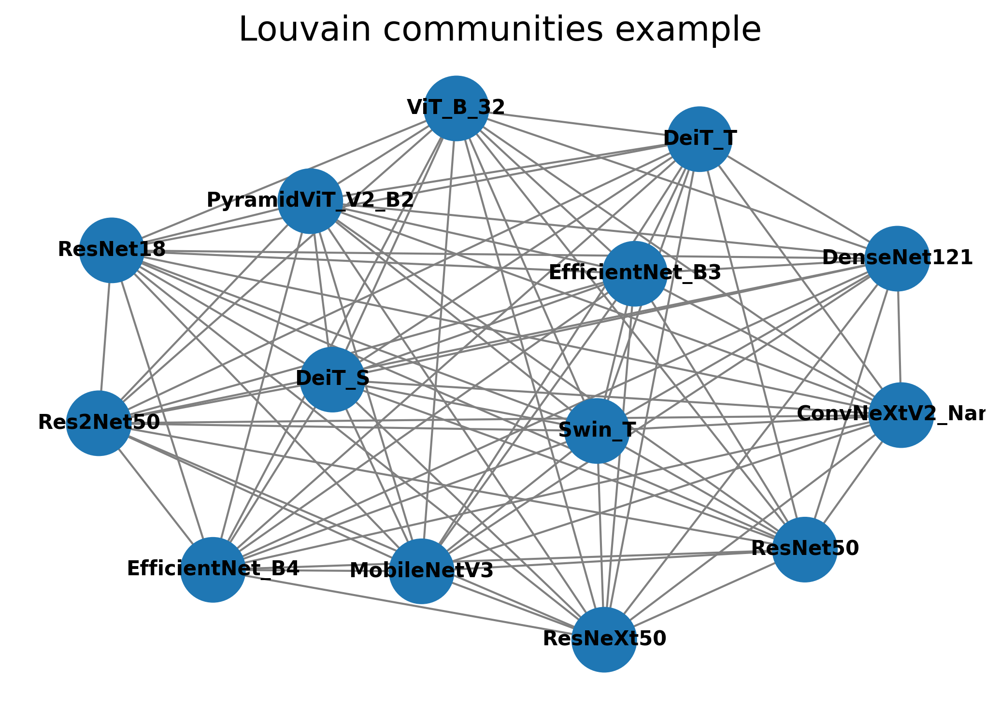

[{'ConvNeXtV2_Nano',
  'DeiT_S',
  'DeiT_T',
  'DenseNet121',
  'EfficientNet_B3',
  'EfficientNet_B4',
  'MobileNetV3',
  'PyramidViT_V2_B2',
  'Res2Net50',
  'ResNeXt50',
  'ResNet18',
  'ResNet50',
  'Swin_T',
  'ViT_B_32'}]

In [7]:
def plot_communities(communities, title, output_filename=None, dpi=300):

    node_colors = {}
    for i, community in enumerate(communities):
        for node in community:
            node_colors[node] = i

    colors = [node_colors[node] for node in G.nodes]
    plt.figure(figsize=(7,5), dpi=dpi)
    ax = plt.gca()
    ax.set_title(title, fontsize=17)
    nx.draw(G, node_color=colors, with_labels=True, cmap=plt.cm.tab20, node_size=1000, font_size=10, font_color='black', edge_color='gray', font_weight='bold', ax=ax)
    _ = ax.axis('off')
    plt.tight_layout()
    if output_filename:
        plt.savefig(output_filename)
    plt.show()


communities = louvain_communities(G, seed=42)
plot_communities(communities, title="Louvain communities example")
communities

In [8]:
tweaked_csv_name_to_resolution_mapping = {
    'dissimilarity_matrix_gradcam_cosine.csv' : 1.06,
    'dissimilarity_matrix_gradcam_rbf.csv' : 1.08,
    'dissimilarity_matrix_integratedgradients_cosine.csv' : 0.807,
    'dissimilarity_matrix_integratedgradients_rbf.csv': 1,
    'dissimilarity_matrix_kernelshap_cosine.csv': 1.075,
    'dissimilarity_matrix_kernelshap_rbf.csv': 1.075,
}

dissimilarity_matrix_kernelshap_rbf.csv


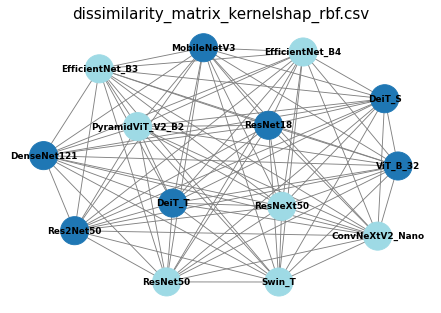

In [9]:
i_to_plot = 5
print(similarity_matriced_csvs[i_to_plot])
df = 1 - pd.read_csv(similarity_matriced_csvs[i_to_plot], index_col=0)
np.fill_diagonal(df.values, 0)
G = nx.from_pandas_adjacency(df)
resolution = 1.075
communities = louvain_communities(G, resolution=resolution, seed=42)
plot_communities(communities, title=similarity_matriced_csvs[i_to_plot], dpi=64)

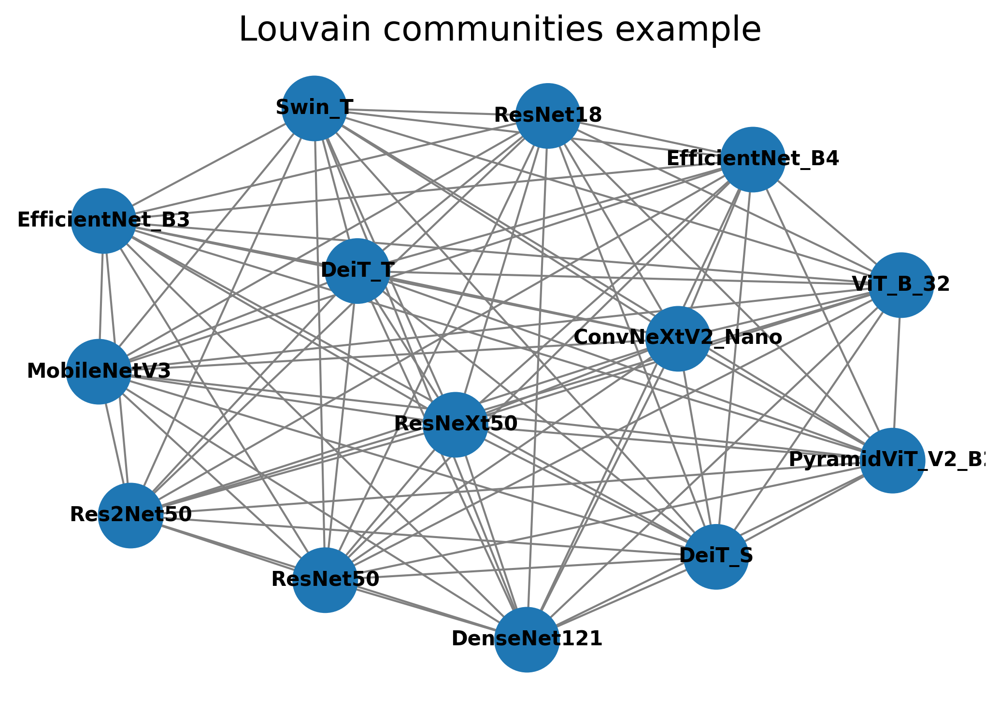

[[{'ConvNeXtV2_Nano',
   'DeiT_S',
   'DeiT_T',
   'DenseNet121',
   'EfficientNet_B3',
   'EfficientNet_B4',
   'MobileNetV3',
   'PyramidViT_V2_B2',
   'Res2Net50',
   'ResNeXt50',
   'ResNet18',
   'ResNet50',
   'Swin_T',
   'ViT_B_32'}]]

In [10]:
communities = list(louvain_partitions(G, resolution=1, threshold=0.0000000001))
for c in communities:
    plot_communities(c, title="Louvain communities example")
communities

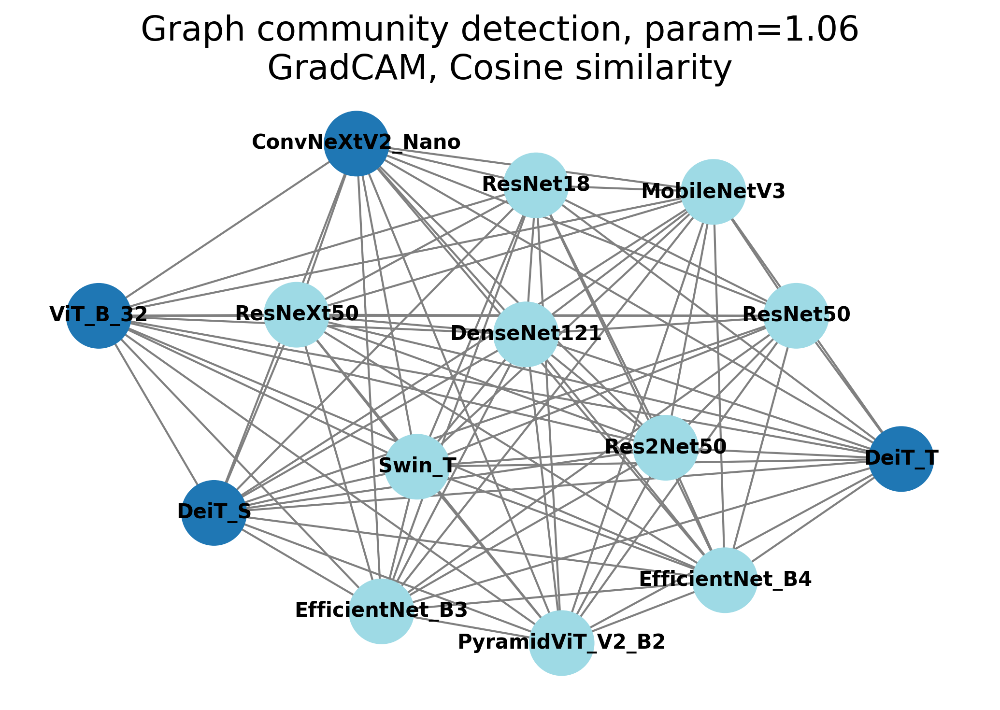

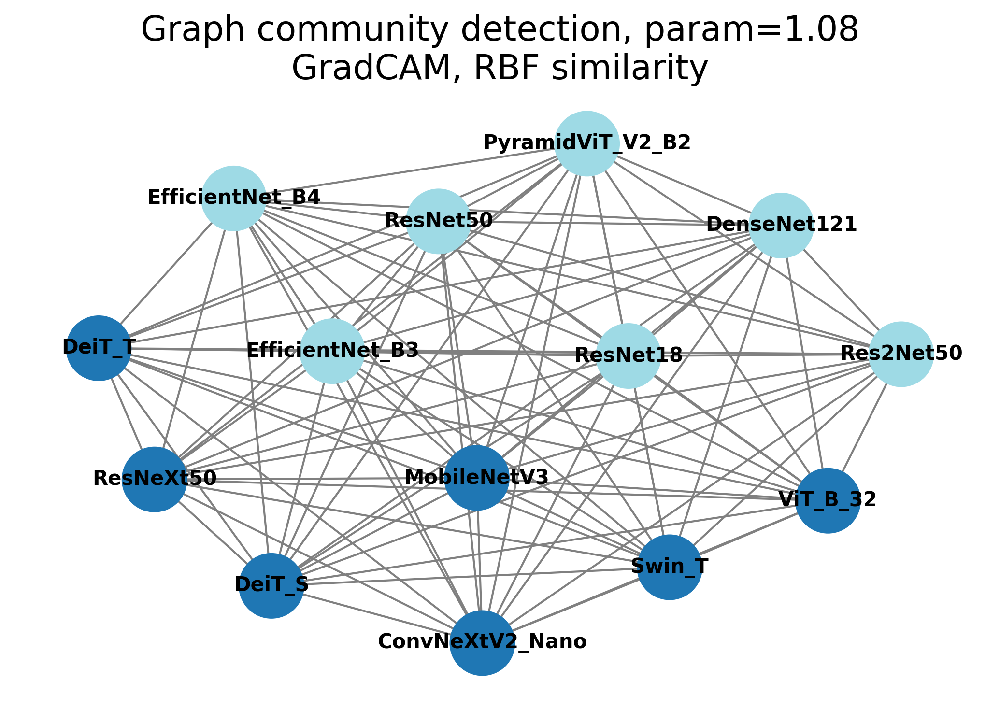

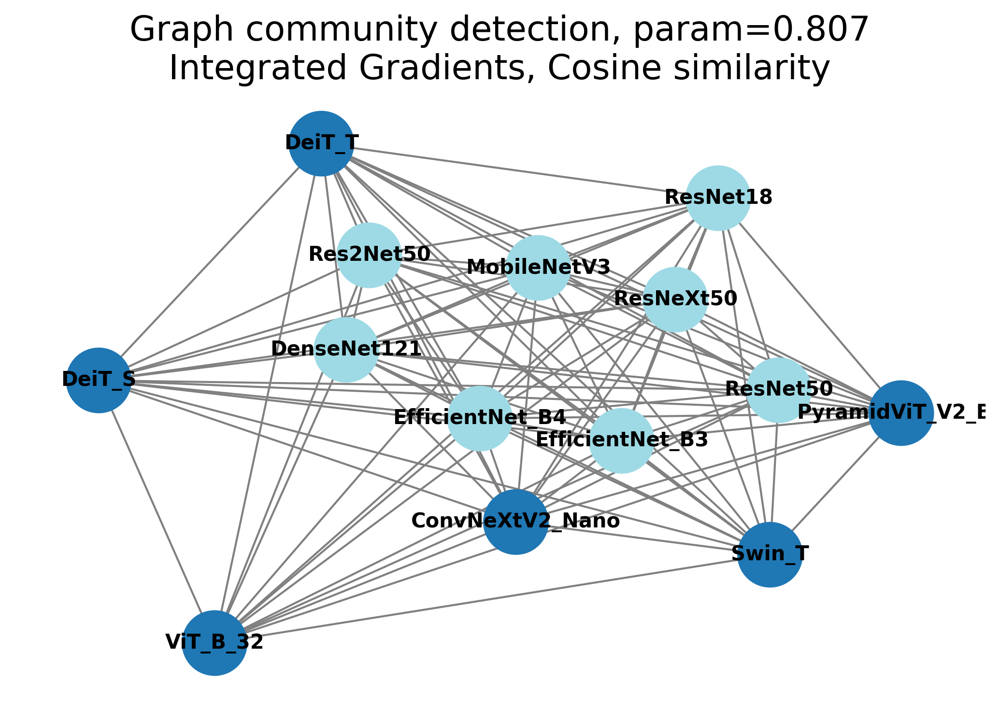

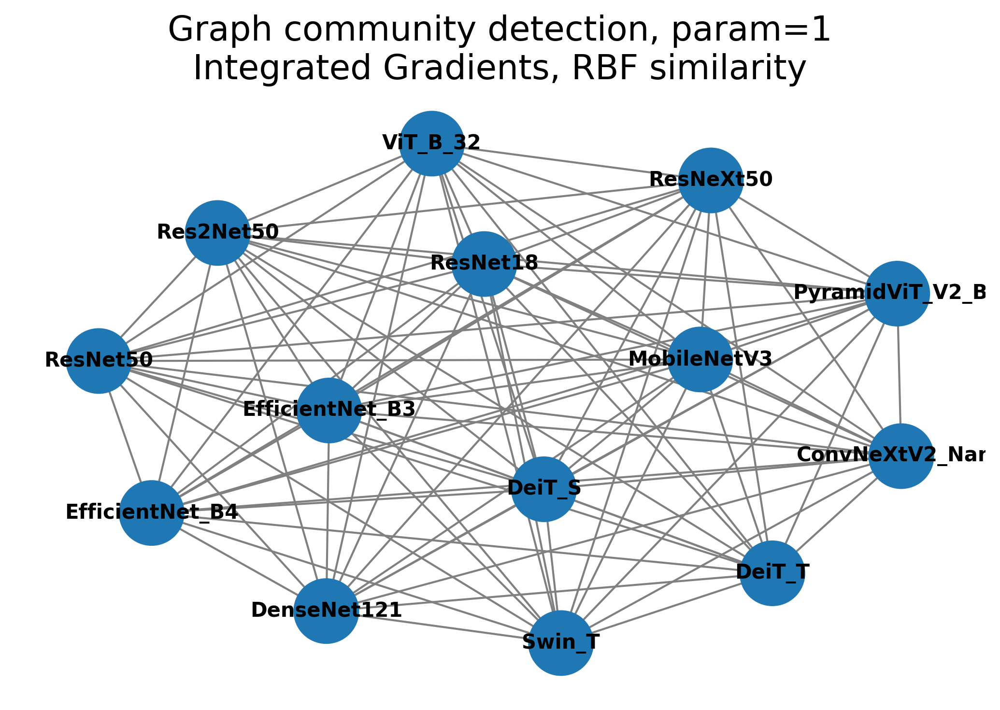

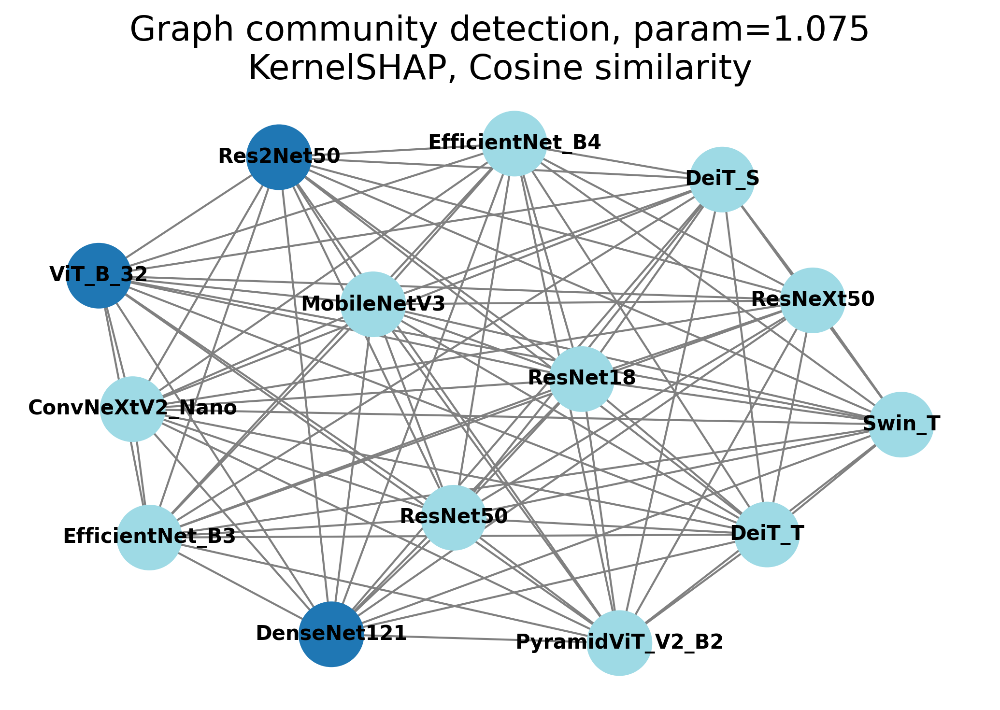

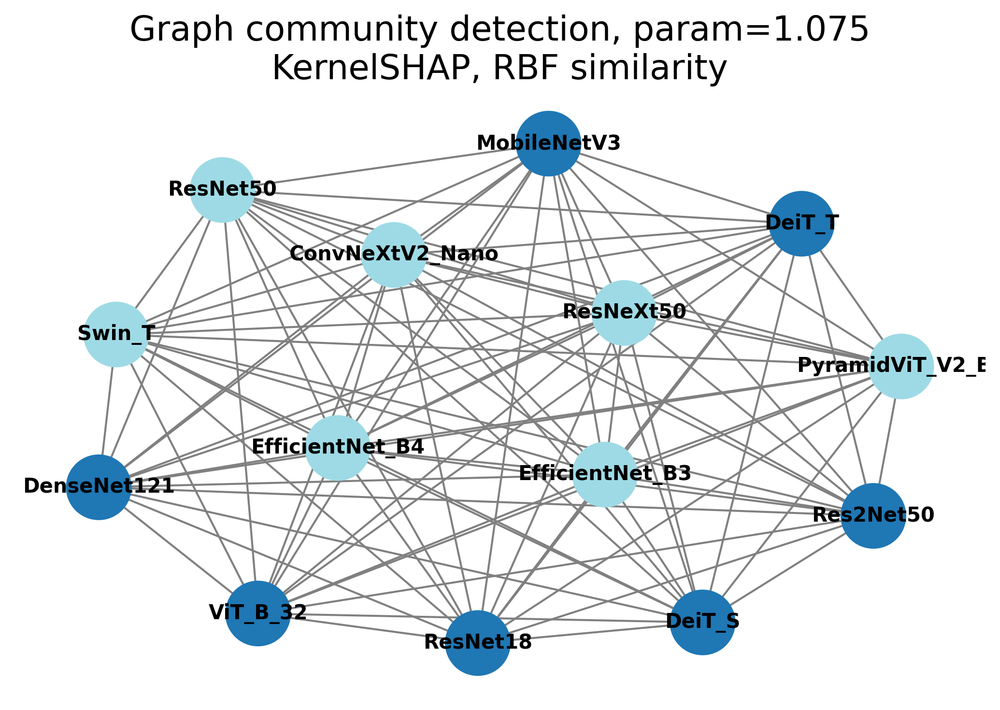

In [11]:
explanation_name_mapping = {
    'integratedgradients': 'Integrated Gradients',
    'gradcam': 'GradCAM',
    'kernelshap': 'KernelSHAP',
}
similarity_name_mapping = {
    'cosine': 'Cosine similarity',
    'rbf': 'RBF similarity',
}

for csv_name in similarity_matriced_csvs:
    resolution = tweaked_csv_name_to_resolution_mapping[csv_name]
    splitted = csv_name.split('_')
    explanation_method, similarity_metric = splitted[2], splitted[3].split('.')[0]
    title = f"Graph community detection, param={resolution}\n{explanation_name_mapping[explanation_method]}, {similarity_name_mapping[similarity_metric]}"
    if "only_matching" in csv_name:
        title += ", only matching predictions"
        output_filename = f'graph_louvain_{explanation_method}_{similarity_metric}_only_matching.png'
    else:
        output_filename = f'graph_louvain_{explanation_method}_{similarity_metric}_all.png'


    # loaded as dissimilarity, so we invert it to similarity by substracting it from 1
    df = 1 - pd.read_csv(csv_name, index_col=0)
    np.fill_diagonal(df.values, 0)
    G = nx.from_pandas_adjacency(df)
    communities = louvain_communities(G, resolution=resolution, seed=42)
    plot_communities(communities, title=title, output_filename=output_filename)


# Hierarchical clustering

In [12]:
# loaded as dissimilarity, so we invert it to similarity by substracting it from 1
df = 1 - pd.read_csv(similarity_matriced_csvs[0], index_col=0)
np.fill_diagonal(df.values, 1)
df

,ConvNeXtV2_Nano,DeiT_S,DeiT_T,DenseNet121,EfficientNet_B3,EfficientNet_B4,MobileNetV3,PyramidViT_V2_B2,Res2Net50,ResNet18,ResNet50,ResNeXt50,Swin_T,ViT_B_32
ConvNeXtV2_Nano,1.000000,0.599930,0.568213,0.657019,0.613485,0.619359,0.683292,0.583949,0.620026,0.687006,0.646588,0.551193,0.630803,0.426295
DeiT_S,0.599930,1.000000,0.641363,0.681799,0.647823,0.676879,0.696507,0.636272,0.663196,0.679909,0.676049,0.578016,0.682245,0.461861
DeiT_T,0.568213,0.641363,1.000000,0.652122,0.594399,0.645951,0.649050,0.588126,0.620469,0.659140,0.638804,0.539890,0.630213,0.413369
DenseNet121,0.657019,0.681799,0.652122,1.000000,0.825941,0.853042,0.824697,0.843718,0.918121,0.868204,0.856513,0.704172,0.825378,0.506774
EfficientNet_B3,0.613485,0.647823,0.594399,0.825941,1.000000,0.808741,0.791642,0.749762,0.836769,0.829367,0.840662,0.737263,0.791190,0.492843
EfficientNet_B4,0.619359,0.676879,0.645951,0.853042,0.808741,1.000000,0.793231,0.812017,0.827458,0.842020,0.841749,0.716915,0.820006,0.510442
MobileNetV3,0.683292,0.696507,0.649050,0.824697,0.791642,0.793231,1.000000,0.748199,0.810787,0.829311,0.838342,0.693716,0.784606,0.507983
PyramidViT_V2_B2,0.583949,0.636272,0.588126,0.843718,0.749762,0.812017,0.748199,1.000000,0.814430,0.757032,0.764426,0.658376,0.791315,0.489674
Res2Net50,0.620026,0.663196,0.620469,0.918121,0.836769,0.827458,0.810787,0.814430,1.000000,0.830429,0.846412,0.715947,0.790748,0.496535
ResNet18,0.687006,0.679909,0.659140,0.868204,0.829367,0.842020,0.829311,0.757032,0.830429,1.000000,0.870691,0.712357,0.821271,0.504220


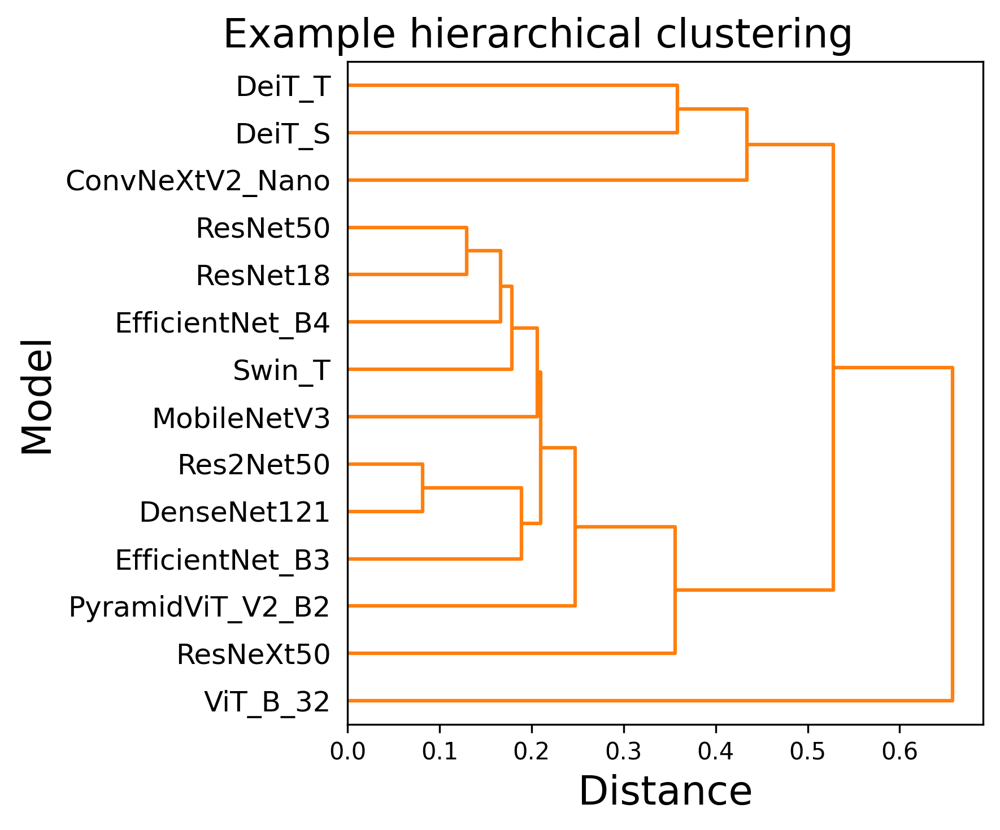

,cluster
ConvNeXtV2_Nano,0
DeiT_S,0
DeiT_T,0
DenseNet121,1
EfficientNet_B3,1
EfficientNet_B4,1
MobileNetV3,1
PyramidViT_V2_B2,1
Res2Net50,1
ResNet18,1


In [13]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import dendrogram, linkage, cut_tree

def hierarchical_clustering(df, title, output_filename=None, color_threshold=1.04):
    similarity_matrix = df.values
    # convert similarity to distance again
    distance_matrix = 1 - similarity_matrix
    # set diagonal to 0
    condensed_dist_matrix = squareform(distance_matrix)
    Z = linkage(condensed_dist_matrix, method='ward')
    plt.figure(figsize=(6, 5), dpi=300)
    dendrogram(Z, labels=df.index, orientation='right', color_threshold=color_threshold) # threshold here matches 3 clusters
    plt.title(title, fontsize=17, x=0.3)
    # move title to be centered not above the plot but a bit to the left
    plt.ylabel('Model', fontsize=17)
    plt.xlabel('Distance', fontsize=17)
    plt.tight_layout()
    if output_filename:
        plt.savefig(output_filename)
    plt.show()
    
    # clusters
    clusters = cut_tree(Z, n_clusters=3)
    clusters_df = pd.DataFrame(clusters, index=df.index, columns=['cluster'])
    clusters_df = clusters_df.sort_values(by='cluster')
    
    return Z, clusters_df

Z, clusters = hierarchical_clustering(df, title="Example hierarchical clustering")
clusters


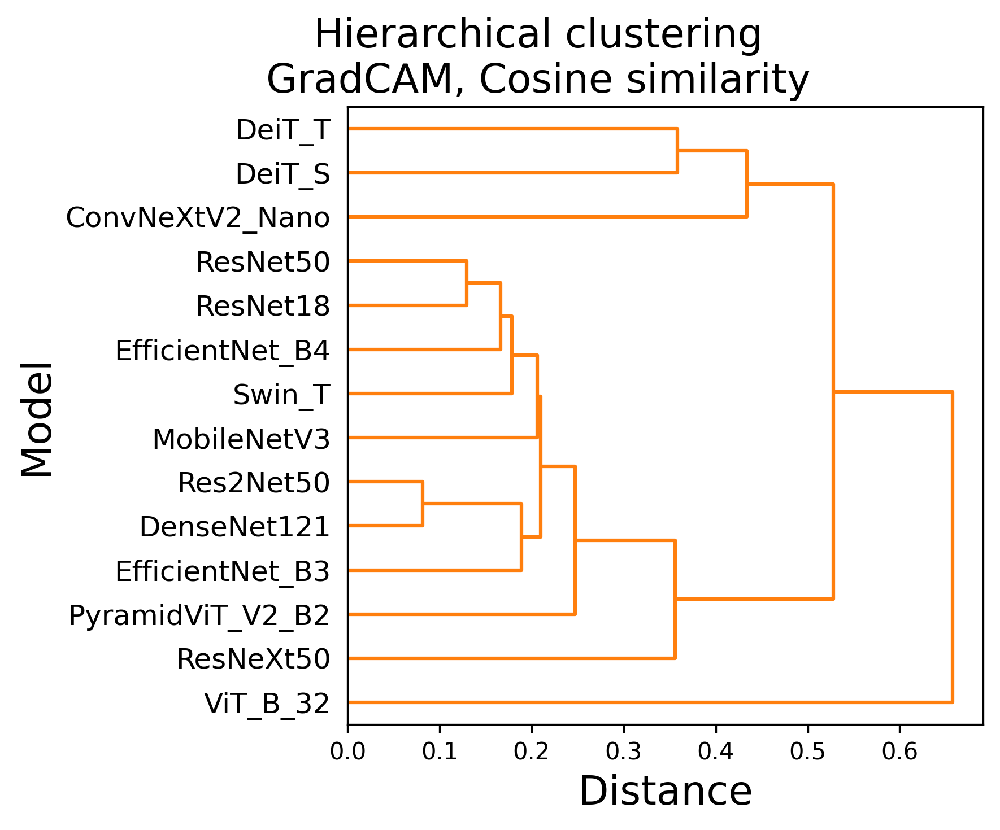

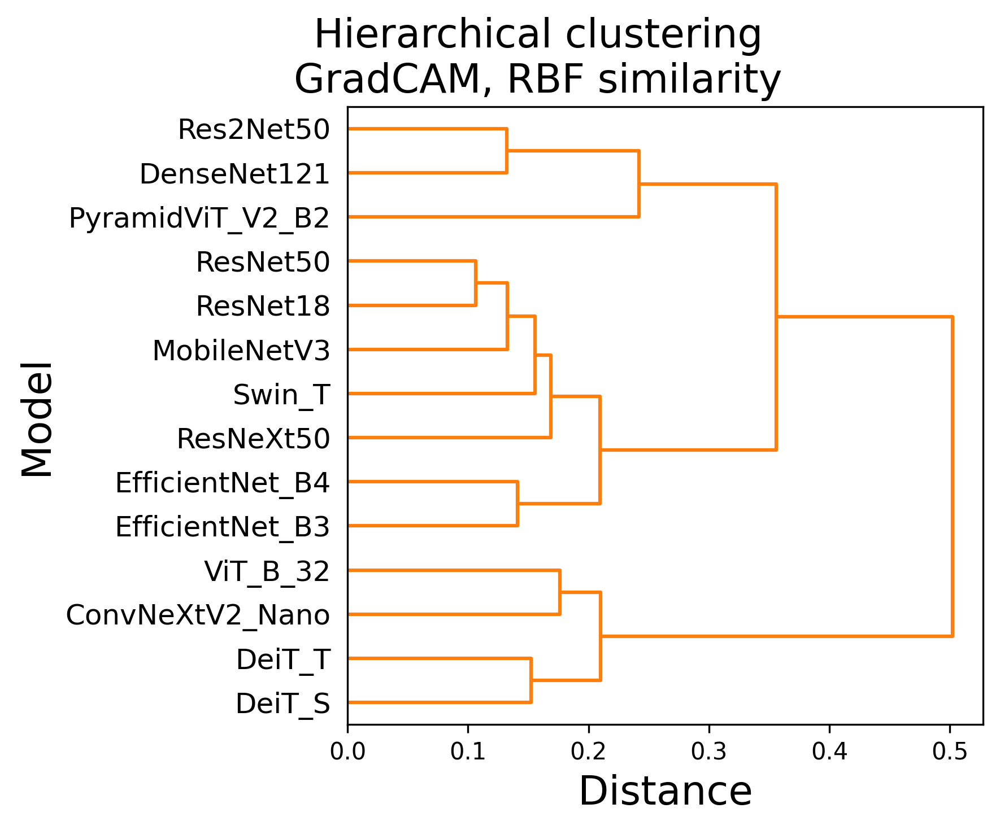

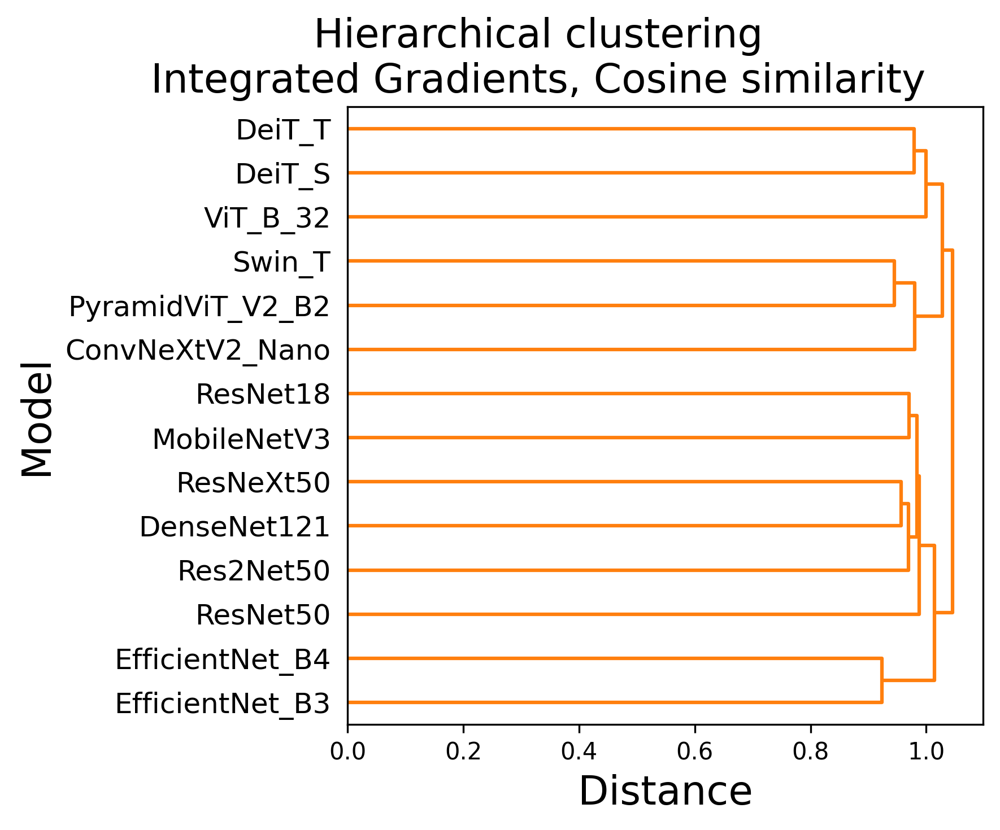

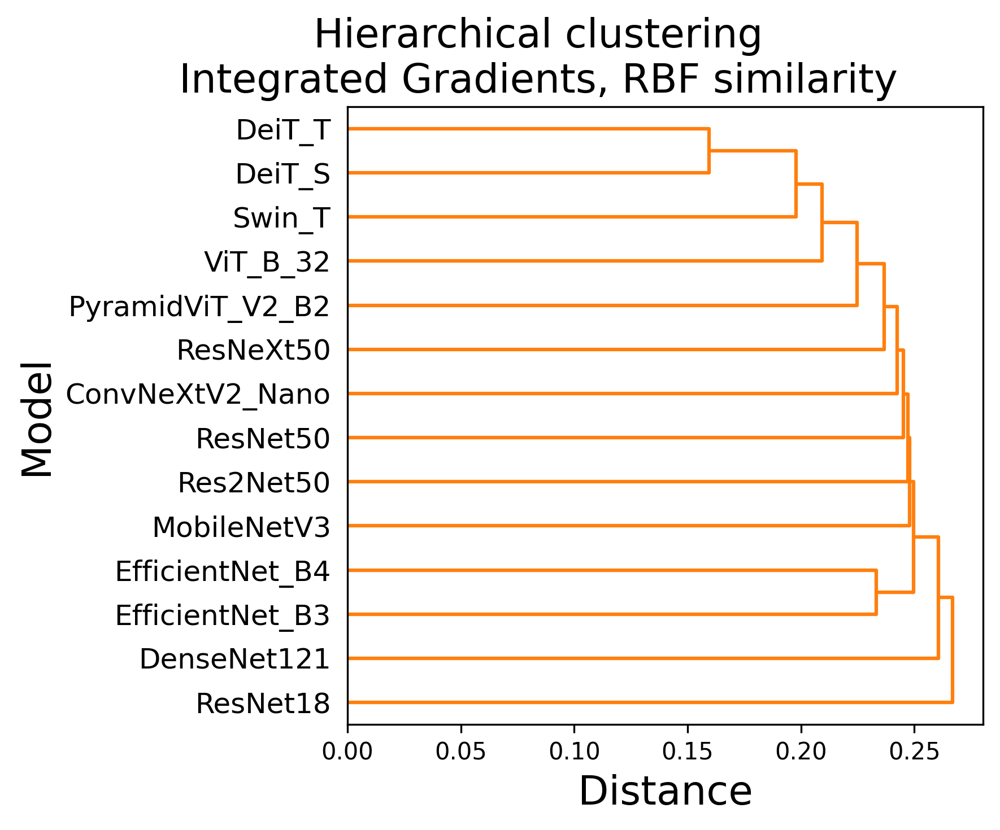

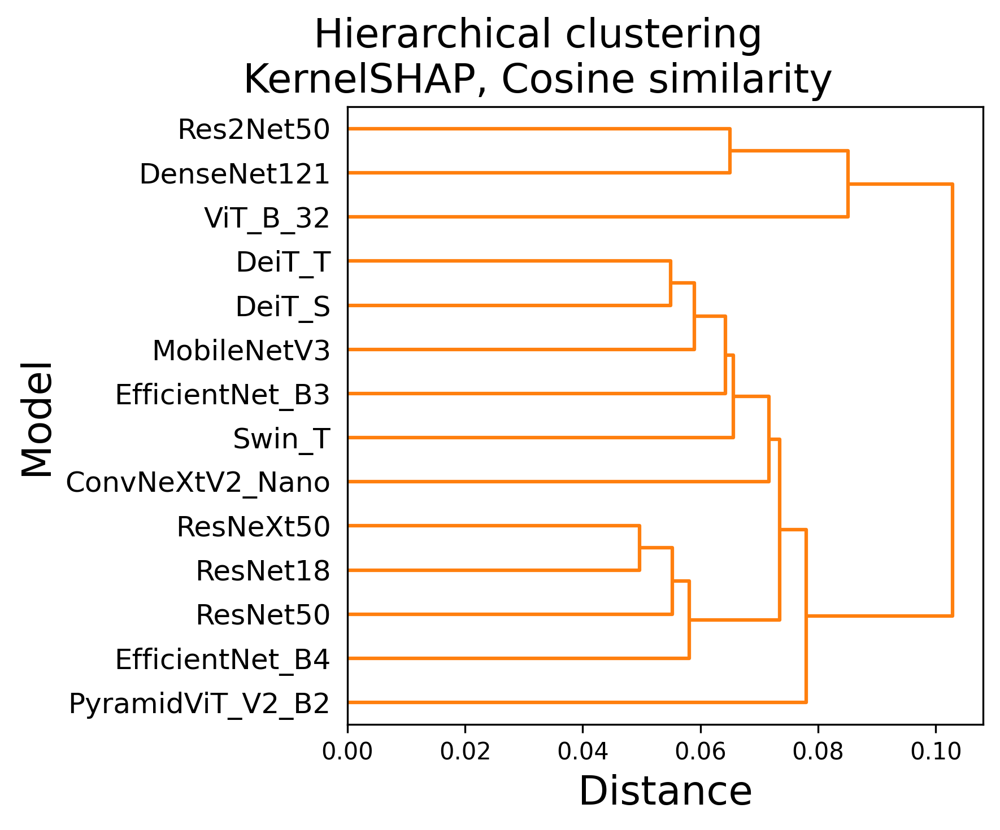

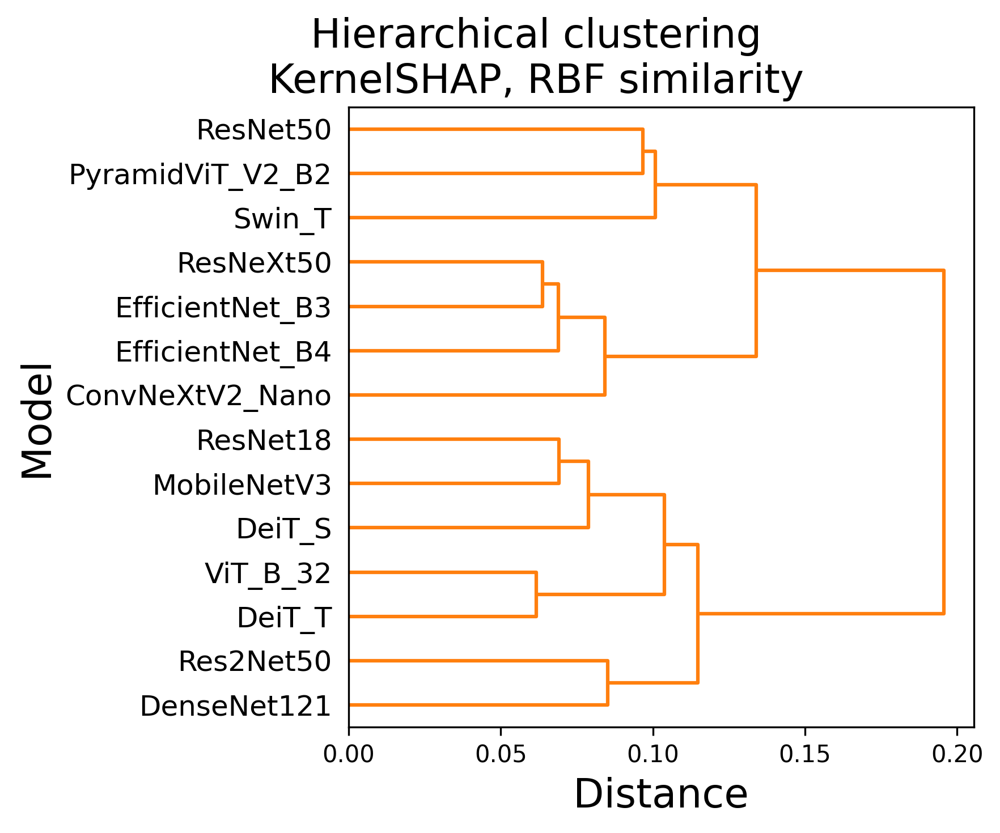

In [14]:
explanation_name_mapping = {
    'integratedgradients': 'Integrated Gradients',
    'gradcam': 'GradCAM',
    'kernelshap': 'KernelSHAP',
}
similarity_name_mapping = {
    'cosine': 'Cosine similarity',
    'rbf': 'RBF similarity',
}

for csv_name in similarity_matriced_csvs:
    splitted = csv_name.split('_')
    explanation_method, similarity_metric = splitted[2], splitted[3].split('.')[0]
    title = f"Hierarchical clustering\n{explanation_name_mapping[explanation_method]}, {similarity_name_mapping[similarity_metric]}"
    if "only_matching" in csv_name:
        title += ", only matching predictions"
        output_filename = f'dendrogram_hierarchical_{explanation_method}_{similarity_metric}_only_matching.png'
    else:
        output_filename = f'dendrogram_hierarchical_{explanation_method}_{similarity_metric}_all.png'

    # loaded as dissimilarity, so we invert it to similarity by substracting it from 1
    df = 1-pd.read_csv(csv_name, index_col=0)
    np.fill_diagonal(df.values, 1)
    Z, clusters = hierarchical_clustering(df, title=title, output_filename=output_filename, color_threshold=2) # 2 makes all same color